In [1]:
!pip install patchmentation -U -qqq

In [2]:
!wget -q -O background_image.jpg   https://raw.githubusercontent.com/Xu-Justin/patchmentation/d888a00400ab58e1dc58a3f060b3b796dd1e3b2a/dataset/campus_garden1_frame1/images/contour2.jpg
!wget -q -O annotation.txt         https://raw.githubusercontent.com/Xu-Justin/patchmentation/d888a00400ab58e1dc58a3f060b3b796dd1e3b2a/dataset/campus_garden1_frame1/labels/contour2.txt
!wget -q -O classes.txt            https://raw.githubusercontent.com/Xu-Justin/patchmentation/d888a00400ab58e1dc58a3f060b3b796dd1e3b2a/dataset/campus_garden1_frame1/obj.names
!wget -q -O distribution_mask.jpg  https://raw.githubusercontent.com/Xu-Justin/patchmentation/d888a00400ab58e1dc58a3f060b3b796dd1e3b2a/dataset/campus_garden1_frame1/distribution_mask/contour2.jpg

In [3]:
import patchmentation
from patchmentation.collections import BBox, Image, Mask, Patch, ImagePatch, Dataset
from patchmentation.utils import functional as F
from patchmentation.utils import loader
from patchmentation.utils import Comparator
from patchmentation.utils import filter
from patchmentation.utils import transform
print(f'version: {patchmentation.__version__}')

import matplotlib
matplotlib.rcParams['figure.dpi'] = 300

version: 0.1.16


## Load Patches from Penn Fudan Ped Dataset

load_penn_fudan_ped_masks: 100%|██████████| 170/170 [00:00<00:00, 219.34it/s]


Number of patches: 423


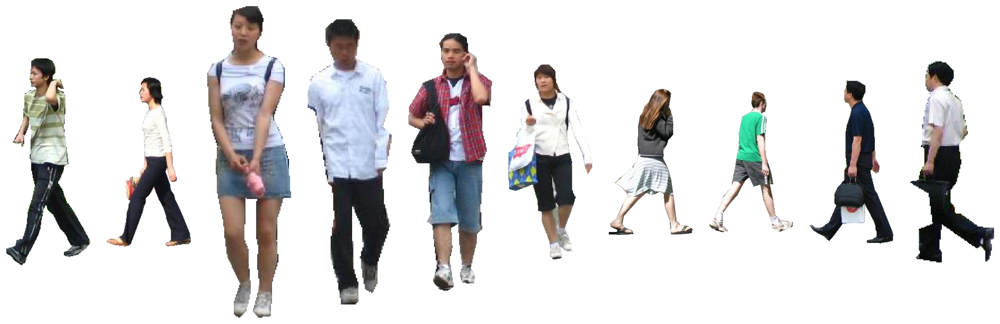

In [4]:
penn_fudan_ped = patchmentation.data.PennFudanPed().load()
patches = []
for image_patch in penn_fudan_ped.image_patches:
    patches += image_patch.patches
    
print(f'Number of patches: {len(patches)}') 
F.display_images(patches[:10])

## Load Background Image

load_yolo_names: 100%|██████████| 1/1 [00:00<00:00, 6105.25it/s]


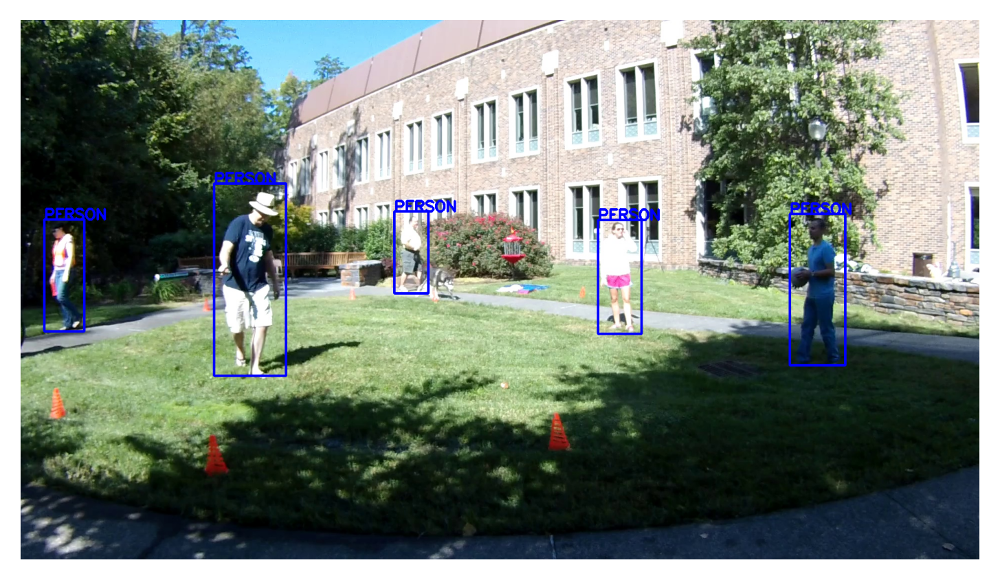

In [5]:
path_image = 'background_image.jpg'
path_annotation = 'annotation.txt'
path_classes = 'classes.txt'

classes = loader.load_yolo_names(path_classes)
background_image = Image(path_image)
background_patches = loader.load_yolo_patches(background_image, path_annotation, classes)
background_image_patch = ImagePatch(background_image, background_patches)

F.display_image(background_image_patch)

## Patch Augmentation

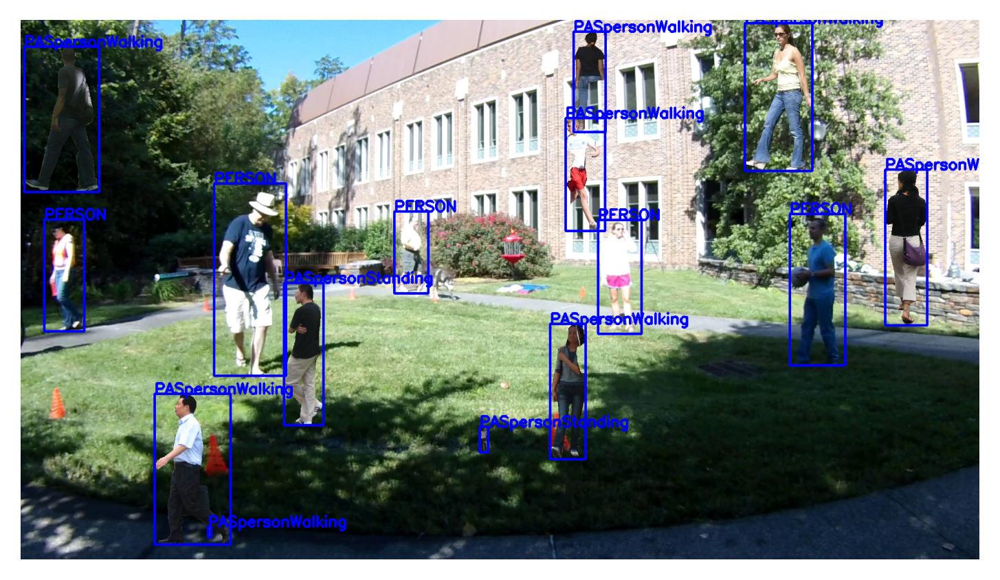

In [6]:
result = patchmentation.patch_augmentation(
    patches, 
    background_image_patch,
    max_n_patches=10
)
F.display_image(result)

## Soft-edge Blending

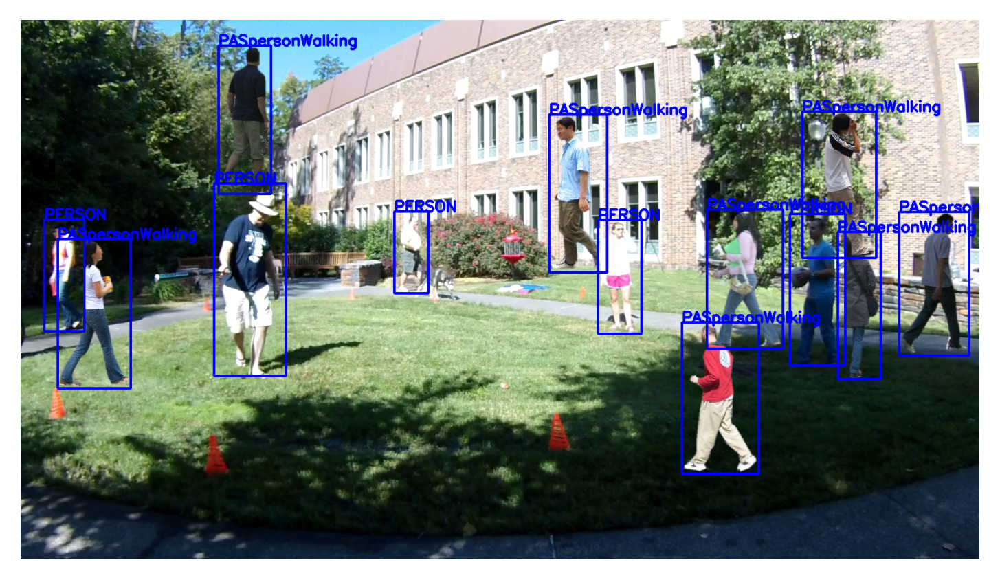

In [7]:
result = patchmentation.patch_augmentation(
    patches, 
    background_image_patch, 
    actions=[
        filter.FilterWidth(25, Comparator.GreaterThan),
        filter.FilterHeight(25, Comparator.GreaterThan),
        transform.SoftEdge(9)
    ],
    max_n_patches=10
)
F.display_image(result)

## Negative Patching

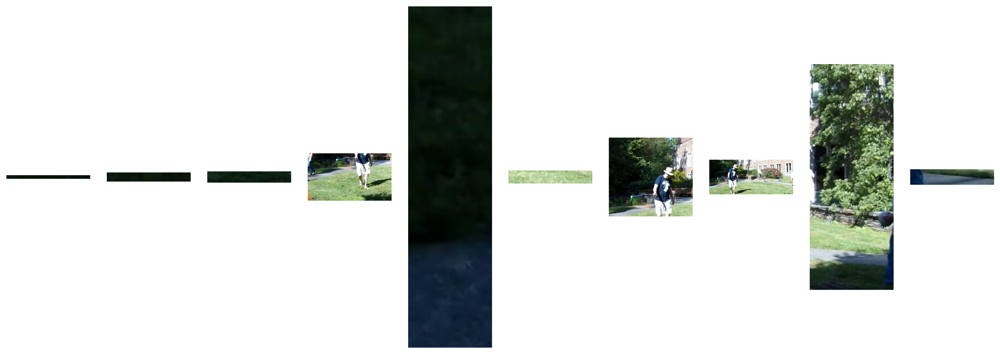

In [8]:
negative_patches = []
for _ in range(200):
    negative_patch = F.get_negative_patch(background_image, 0.5)
    if negative_patch is not None:
        negative_patches.append(negative_patch)

F.display_images(negative_patches[:10])

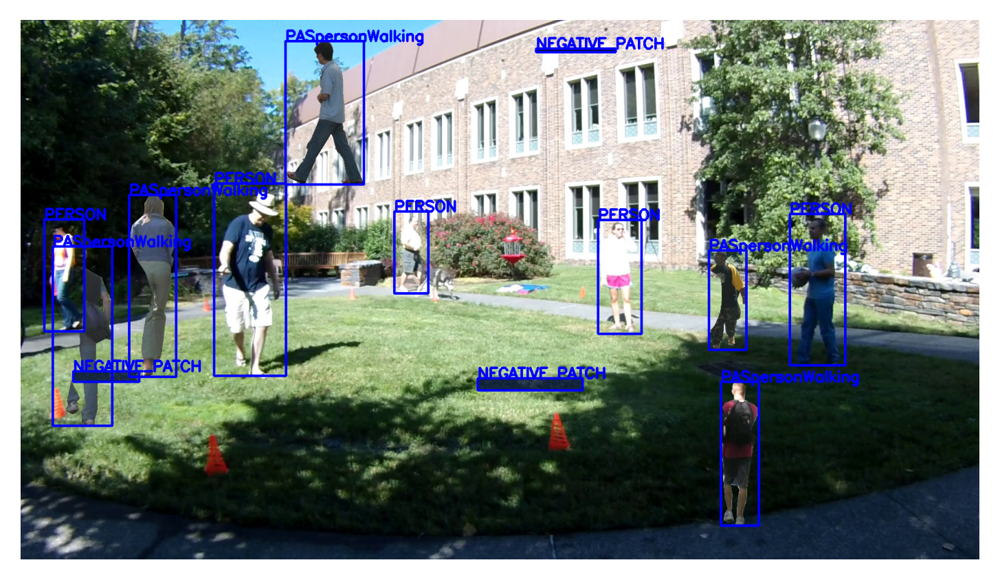

In [9]:
result = patchmentation.patch_augmentation(
    patches + negative_patches, 
    background_image_patch,
    max_n_patches=10
)
F.display_image(result)

## Distribution Mask

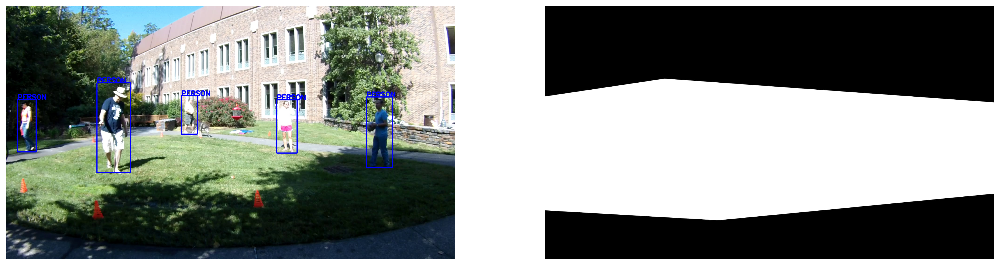

In [10]:
path_distribution_mask = 'distribution_mask.jpg'
distribution_mask = Mask(path_distribution_mask)
F.display_images([background_image_patch, distribution_mask])

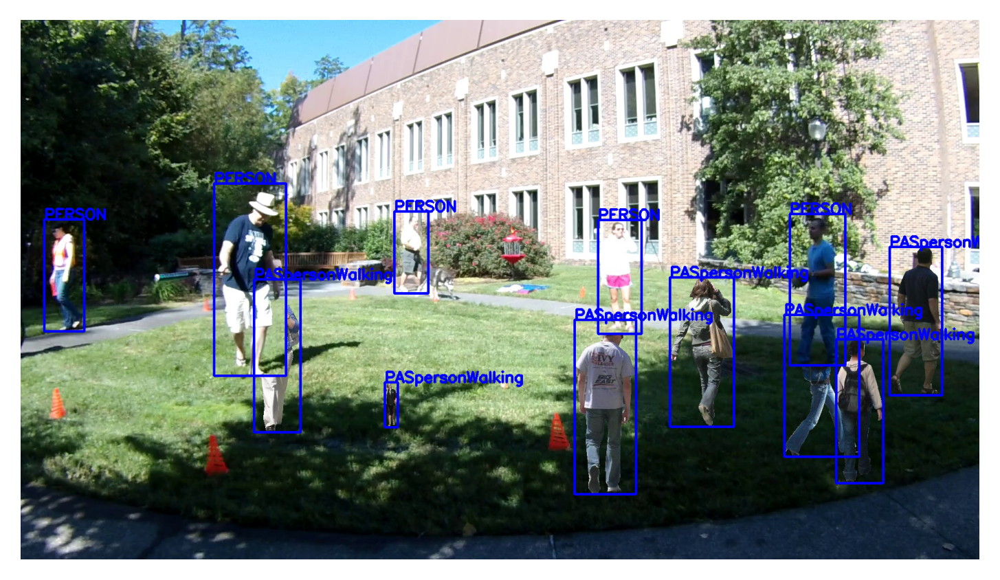

In [11]:
result = patchmentation.patch_augmentation(
    patches, 
    background_image_patch, 
    patch_distribution=distribution_mask,
    max_n_patches=10
)
F.display_image(result)